In [1]:
%matplotlib inline
import os
import random
import skimage.data
import skimage.transform
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.python.framework import ops
import h5py
import math
import warnings
warnings.filterwarnings("ignore")

In [3]:
cd C:\Users\keeps\Desktop

C:\Users\keeps\Desktop


## Get the Image Data and Covnert Them Into Numpy Arrays of RGB Values

In [6]:
def getData(data_dir):
    directories = [d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))]
    labels = []
    images = []
    dataDict={}
    for d in directories:
        i = 0
        label_dir = os.path.join(data_dir, d)
        file_names = [os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith(".jpg")]
        for f in file_names:
            i+=1
            images.append(skimage.data.imread(f))
            labels.append(int(d))
        dataDict[d]=i
    return images, labels,dataDict

In [14]:
images, labels, dataDict = getData('CSC578_Final_Project\\training_data')

In [15]:
print("Number of Images of Rating 1: {}".format(dataDict['0']))
print("Number of Images of Rating 2: {}".format(dataDict['1']))
print("Number of Images of Rating 3: {}".format(dataDict['2']))
print("Number of Images of Rating 4: {}".format(dataDict['3']))
print("Number of Images of Rating 5: {}".format(dataDict['4']))
print("Total Images: {}".format(len(images)))

Number of Images of Rating 1: 69
Number of Images of Rating 2: 81
Number of Images of Rating 3: 75
Number of Images of Rating 4: 138
Number of Images of Rating 5: 37
Total Images: 400


## Display Image (Sanity Check)

In [20]:
def displayImages(images, label):
    plt.figure(figsize=(40, 40))
    numPic = 9 
    i = 1
    start = labels.index(label)
    end = start + labels.count(label)
    for image in images[start:end][:numPic]:
        plt.subplot(3, 3, i)
        plt.axis('off')
        plt.imshow(image,aspect='auto')
        i += 1
    plt.show()

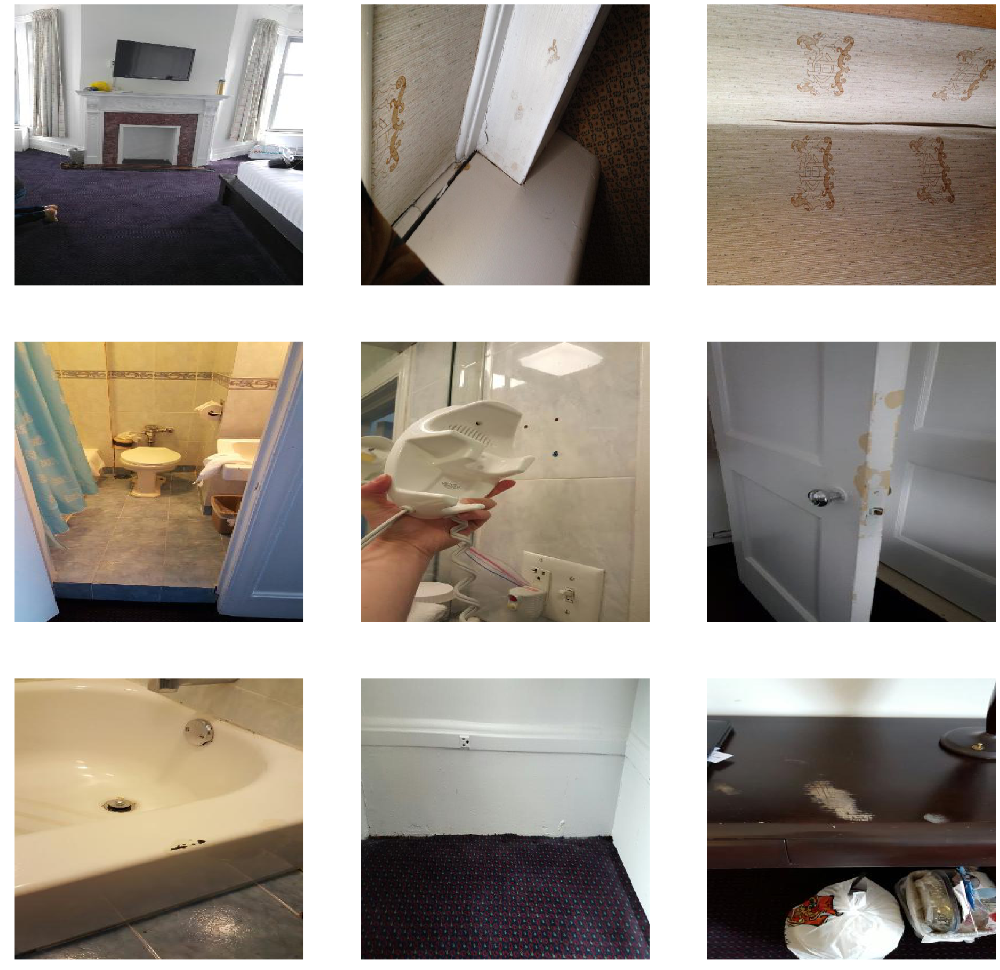

In [29]:
displayImages(images,0)

## Resize Image So Each Image Has Same Dimension

In [22]:
def resizeImg(dimension):
    newImages = [skimage.transform.resize(image, (dimension, dimension))for image in images]
    newImages = [ 255*newImage for newImage in newImages]
    convertImages=[]
    for newImage in newImages:
        convertImage = newImage.astype(np.uint8)
        convertImages.append(convertImage)
    return convertImages

In [23]:
img227=resizeImg(227)

In [26]:
img227[0].shape

(227, 227, 3)

## Take A Look At The Images Of Each Rating

### Rating 1

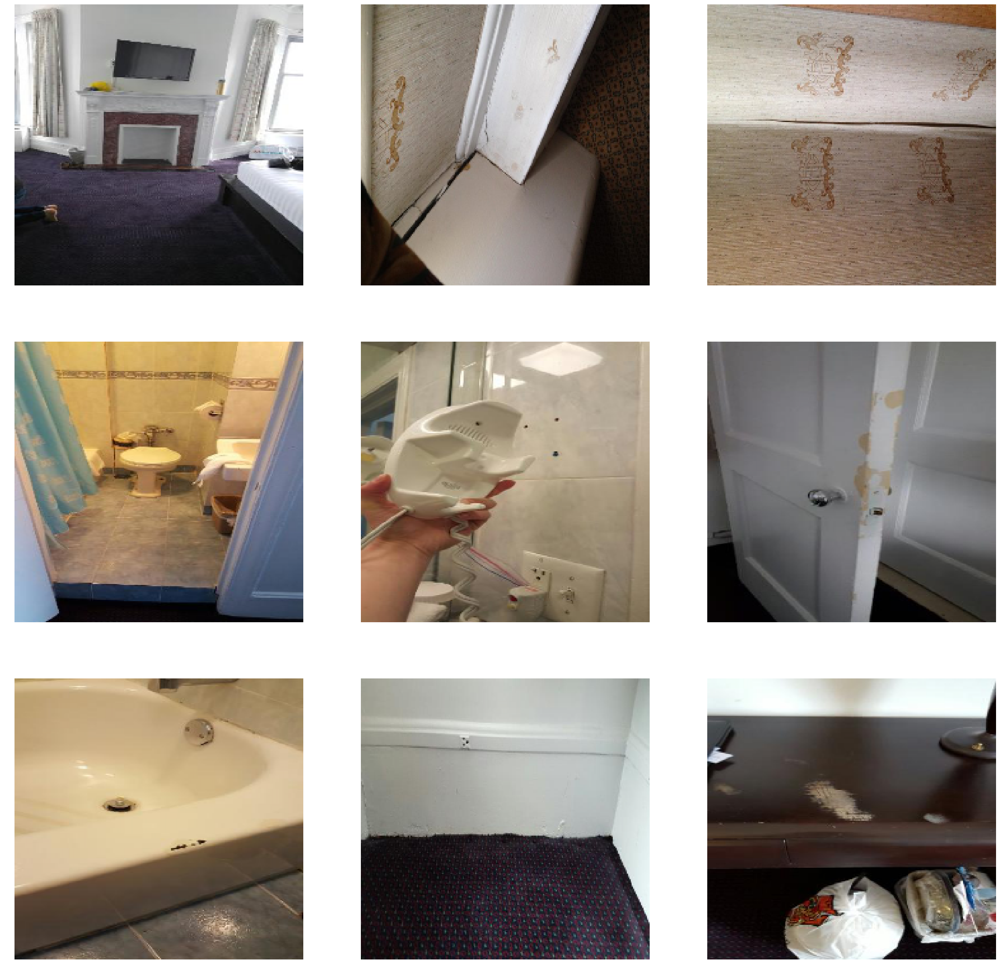

In [30]:
displayImages(img227,0)

### Rating 2

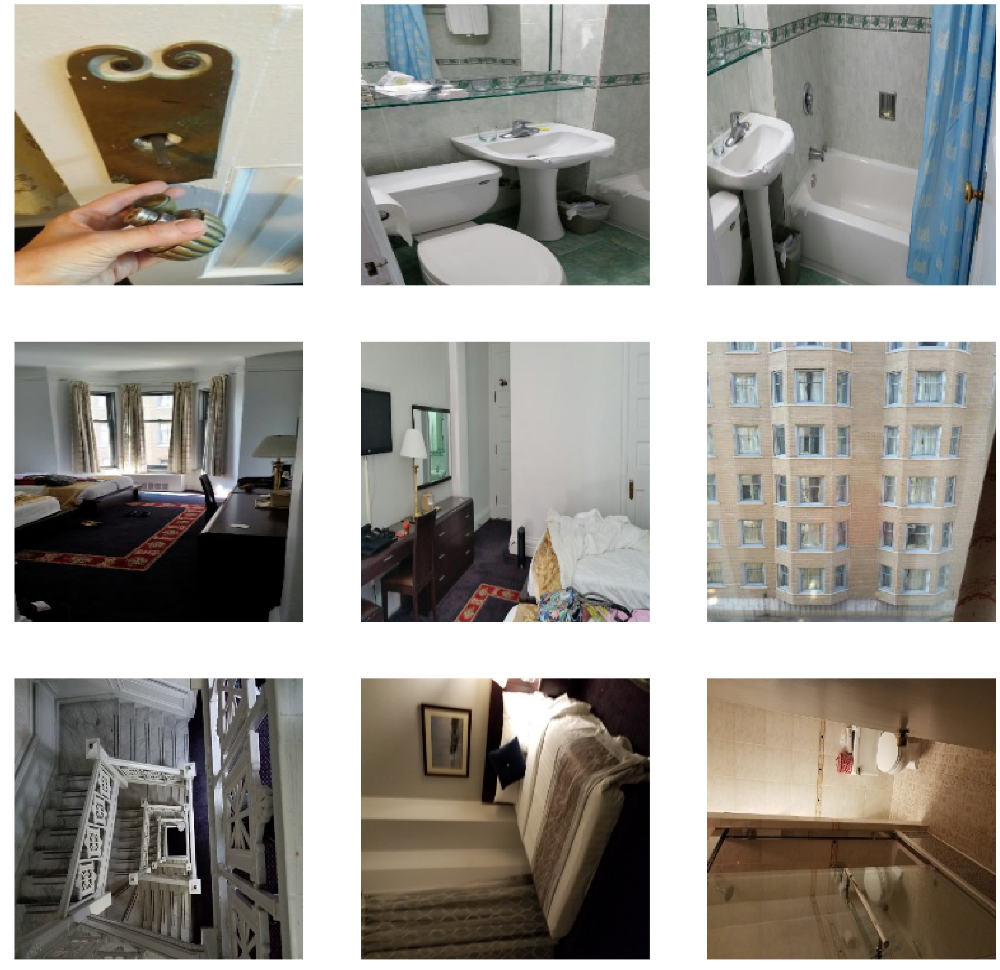

In [56]:
displayImages(img227,1)

### Rating 3

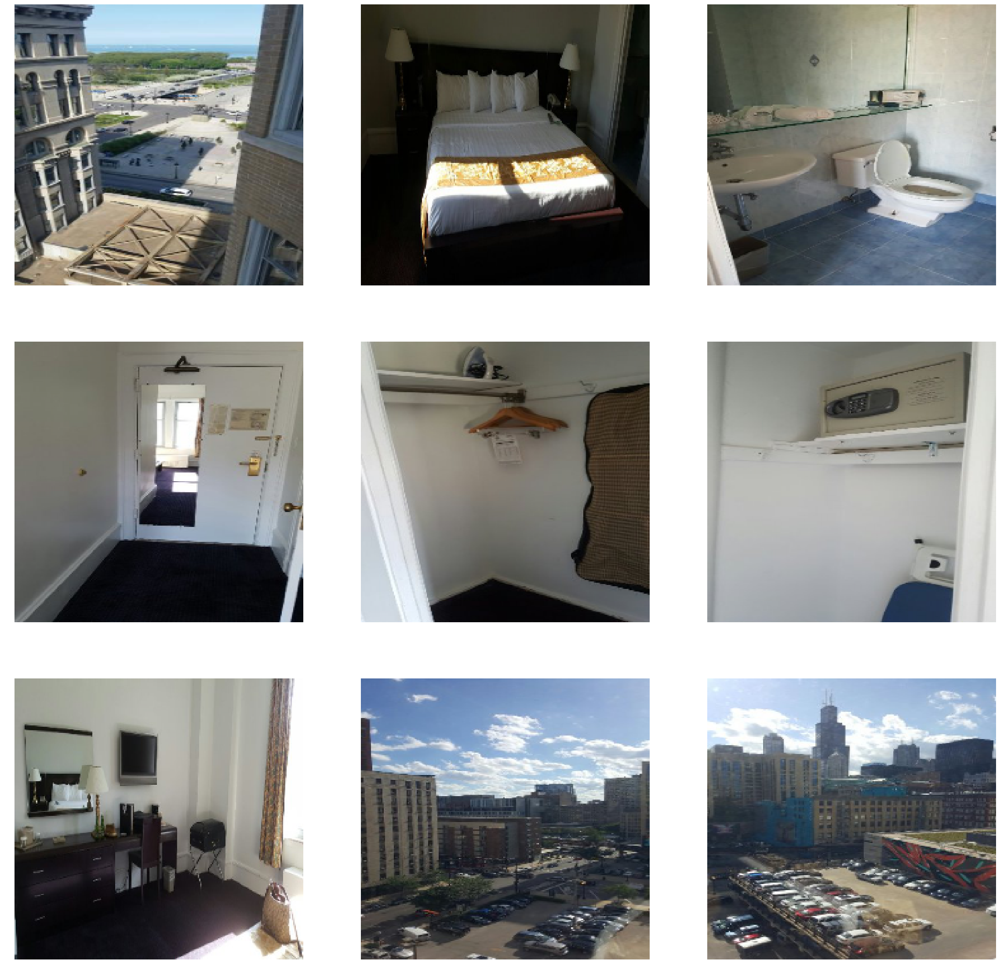

In [31]:
displayImages(img227,2)

### Rating 4

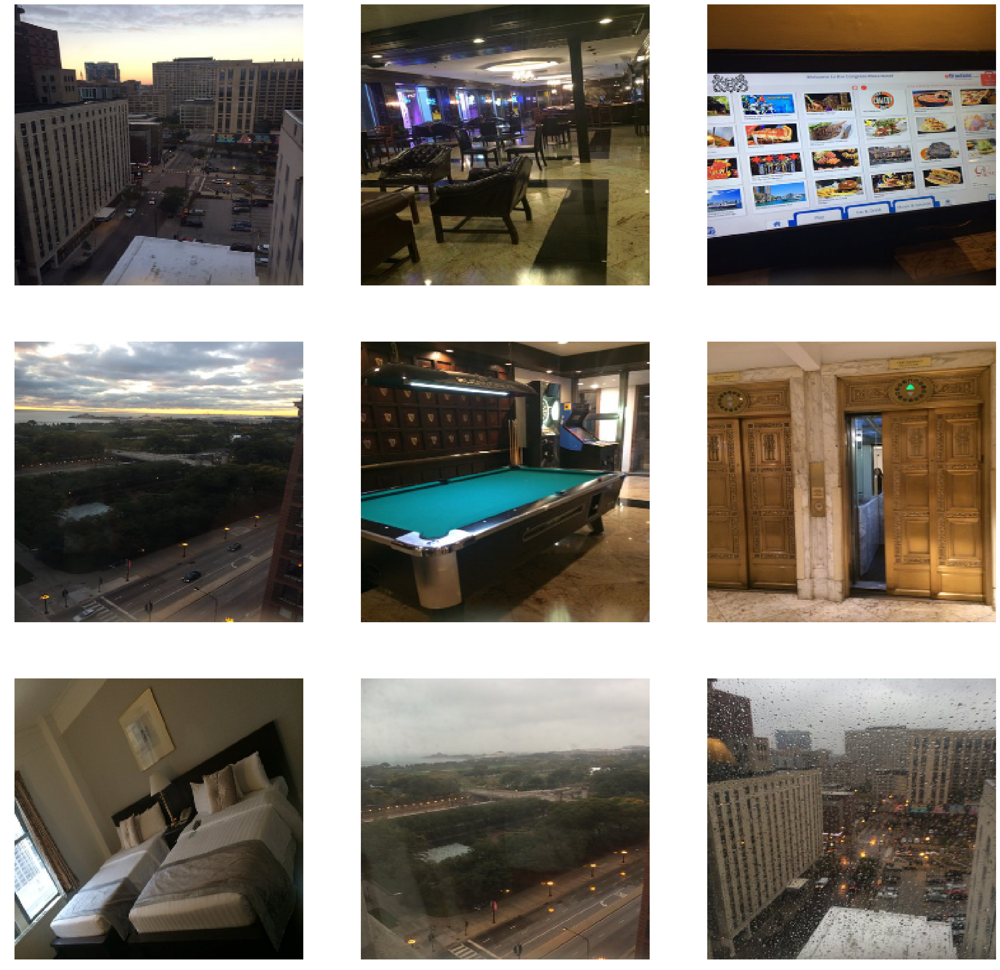

In [33]:
displayImages(img227,3)

### Rating 5

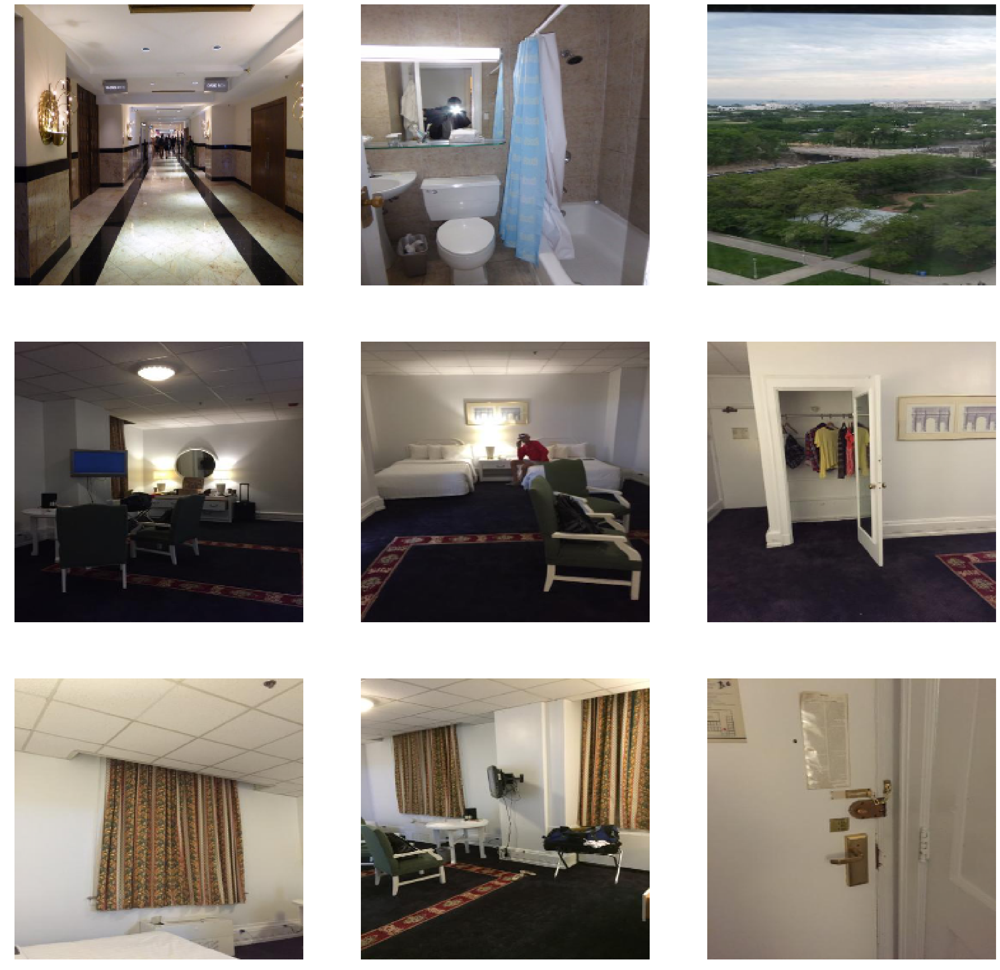

In [35]:
displayImages(img227,4)

### Convert One List of 3-D Numpy Arrays to 4-D Numpy Arrays

In [36]:
imagesArr = np.array(img227)
labelsArr = np.array(labels)
print("labels: ", labelsArr.shape, "\nimages: ", imagesArr.shape)

labels:  (400,) 
images:  (400, 227, 227, 3)


## Sanity Check

rating is : 5


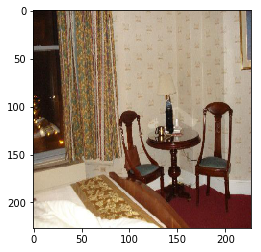

In [37]:
index = 397
plt.imshow(imagesArr[index])
print ("rating is : " + str(labelsArr[index]+1))

## Save the data for future use

In [51]:
img227Arr=np.array(img227)

In [54]:
image227RGBValues = img227Arr.reshape(img227Arr.shape[0], -1)

In [55]:
#227*227*3=154587
image227RGBValues.shape

(400, 154587)

In [27]:
np.savetxt('imageLabels.txt',labelsArr)

In [56]:
with h5py.File('image227RGB.h5', 'w') as hf:
    hf.create_dataset("image(227*227*3)",  data=image227RGBValues)

## Sanity Check(Load The Data Back In)

In [77]:
with h5py.File('imageRGB.h5', 'r') as hf:
    imageInput = hf['image(227*227*3)'][:]

In [78]:
imageInput=imageInput.reshape(400,227,227,3)

In [79]:
imageInput.shape

(400, 227, 227, 3)

In [80]:
imageLabels=np.loadtxt('imageLabels.txt')

In [81]:
imageLabels.shape

(400,)

rating is : 5.0


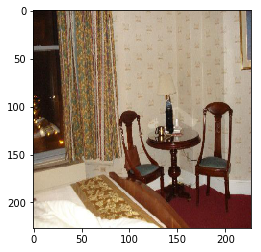

In [82]:
index = 397
plt.imshow(imageInput[index])
print ("rating is : " + str(imageLabels[index]+1))

## Good! We are ready to Go!

### Preprocess the data

### One Hot Encoding

In [40]:
def oneHotConvert(Y, C):
    Y = np.eye(C)[Y.reshape(-1)].T
    return Y

In [42]:
print("Before converting:")
print(labelsArr[:3])

Before converting:
[0 0 0]


In [43]:
numClasses=5
oHlabelsArr = oneHotConvert(labelsArr, C = numClasses).T
print ("After converting: ")
print(str(oHlabelsArr))

After converting: 
[[ 1.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.]
 [ 1.  0.  0.  0.  0.]
 ..., 
 [ 0.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  1.]
 [ 0.  0.  0.  0.  1.]]


In [44]:
oHlabelsArr.shape

(400, 5)

In [45]:
labelsArr.shape

(400,)

### Normalize Data

In [46]:
imagesArr_norm = imagesArr/255
imagesArr_norm.shape

(400, 227, 227, 3)

### Split into train and test set

In [47]:
# First Shuffle the data
np.random.seed(0)                            # set seed
m = imagesArr_norm.shape[0]                  # number of training examples
permutation = list(np.random.permutation(m))
shuffled_imagesArr_norm = imagesArr_norm[permutation,:,:,:]
shuffled_oHlabelsArr = oHlabelsArr[permutation,:]
shuffled_labelsArr=labelsArr[permutation]


###Split into train and test set
testRatio=0.1
X_train=shuffled_imagesArr_norm[:int(m*(1-testRatio)),:,:,:]
Y_train=shuffled_oHlabelsArr[:int(m*(1-testRatio)),:]
train_labels=shuffled_labelsArr[:int(m*(1-testRatio))]
X_test=shuffled_imagesArr_norm[int(m*(1-testRatio)):,:,:,:]
Y_test=shuffled_oHlabelsArr[int(m*(1-testRatio)):,:]
test_labels=shuffled_labelsArr[int(m*(1-testRatio)):]
print ("number of training examples = " + str(X_train.shape[0]))
print ("number of test examples = " + str(X_test.shape[0]))
print ("X_train shape: " + str(X_train.shape))
print ("Y_train shape: " + str(Y_train.shape))
print ("X_test shape: " + str(X_test.shape))
print ("Y_test shape: " + str(Y_test.shape))
conv_layers = {}

number of training examples = 360
number of test examples = 40
X_train shape: (360, 227, 227, 3)
Y_train shape: (360, 5)
X_test shape: (40, 227, 227, 3)
Y_test shape: (40, 5)


## Sanity Check(confirm shuffle is done correctly!)

rating is : 2


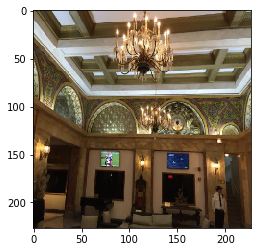

In [49]:
index = 397
plt.imshow(shuffled_imagesArr_norm[index])
print ("rating is : " + str(np.argmax(shuffled_oHlabelsArr[index])+1))

# Now we start building CNN (The structure of the code in this part is from Andrew Ng's Model but I wrote the code of tensorflow functions  )

## Create Placeholder

In [51]:
def create_placeholders(n_H0, n_W0, n_C0, n_y):
    X = tf.placeholder(tf.float32, [None, n_H0, n_W0, n_C0])
    Y = tf.placeholder(tf.float32, [None, n_y])
    return X, Y

## initialize_parameters

In [52]:
def initialize_parameters():
    tf.set_random_seed(1)                         
    W1 = tf.get_variable("W1", [4, 4, 3, 8], initializer=tf.contrib.layers.xavier_initializer(seed=0))
    W2 = tf.get_variable("W2", [2, 2, 8, 16], initializer=tf.contrib.layers.xavier_initializer(seed=0))
    parameters = {"W1": W1,
                  "W2": W2}
    return parameters

## Forward

In [23]:
def forward_propagation(X, parameters):
    W1 = parameters['W1']
    W2 = parameters['W2']

    Z1 = tf.nn.conv2d(X, W1, strides=[1, 1, 1, 1], padding='SAME')
    A1 = tf.nn.relu(Z1)
    P1 = tf.nn.max_pool(A1, ksize = [1, 8, 8, 1], strides = [1, 8, 8, 1], padding='SAME')
    Z2 = tf.nn.conv2d(P1, W2, strides=[1, 1, 1, 1], padding='SAME')
    A2 = tf.nn.relu(Z2)
    P2 = tf.nn.max_pool(A2, ksize = [1, 4, 4, 1], strides = [1, 4, 4, 1], padding='SAME')
    P = tf.contrib.layers.flatten(P2)
    Z3 = tf.contrib.layers.fully_connected(P, 5, activation_fn=None)

    return Z3

## Compute Cost

In [24]:
def compute_cost(Z3, Y):
    cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=Z3, labels=Y))
    
    return cost

## Random Mini Batch

In [54]:
def random_mini_batches(X, Y, mini_batch_size = 64, seed = 0):
    m = X.shape[0]                 
    mini_batches = []
    np.random.seed(seed)
    permutation = list(np.random.permutation(m))
    shuffled_X = X[permutation,:,:,:]
    shuffled_Y = Y[permutation,:]
    num_complete_minibatches = math.floor(m/mini_batch_size)     
    for k in range(0, num_complete_minibatches):
        mini_batch_X = shuffled_X[k * mini_batch_size : k * mini_batch_size + mini_batch_size,:,:,:]
        mini_batch_Y = shuffled_Y[k * mini_batch_size : k * mini_batch_size + mini_batch_size,:]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    if m % mini_batch_size != 0:
        mini_batch_X = shuffled_X[num_complete_minibatches * mini_batch_size : m,:,:,:]
        mini_batch_Y = shuffled_Y[num_complete_minibatches * mini_batch_size : m,:]
        mini_batch = (mini_batch_X, mini_batch_Y)
        mini_batches.append(mini_batch)
    
    return mini_batches

## Build The Model

In [33]:
def model_with_L2(X_train, Y_train, X_test, Y_test, lambd=0.1,minibatch_size = 64,num_epochs = 30, learning_rate = 0.009,print_cost = True):
    
    ops.reset_default_graph()                         
    tf.set_random_seed(1)                            
    seed = 3                                          
    (m, n_H0, n_W0, n_C0) = X_train.shape             
    n_y = Y_train.shape[1]                            
    costs = []                                        
    trainAccuracy=[]
    testAccuracy=[]

    X, Y = create_placeholders(n_H0, n_W0, n_C0, n_y)

    parameters = initialize_parameters()
    W1 = parameters['W1']
    W2 = parameters['W2']
 
    Z3 = forward_propagation(X, parameters)
 
    cost = compute_cost(Z3, Y)
    if (lambd!=0):
        reg = tf.nn.l2_loss(W1)+tf.nn.l2_loss(W2)
        cost = tf.reduce_mean(cost + reg * lambd)

    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)
   
    init = tf.global_variables_initializer()
     
  
    with tf.Session() as sess:
        
        sess.run(init)
        for epoch in range(num_epochs):

            minibatch_cost = 0.
            num_minibatches = int(m / minibatch_size) 
            seed = seed + 1
            minibatches = random_mini_batches(X_train, Y_train, minibatch_size, seed)

            for minibatch in minibatches:

                
                (minibatch_X, minibatch_Y) = minibatch
                _ , temp_cost = sess.run([optimizer, cost], feed_dict={X:minibatch_X, Y:minibatch_Y})
                
                minibatch_cost += temp_cost / num_minibatches

        
            if print_cost == True and epoch % 1 == 0:
                costs.append(minibatch_cost)
            if print_cost == True and epoch % 1 == 0:
                predict_op = tf.argmax(Z3, 1)
                correct_prediction = tf.equal(predict_op, tf.argmax(Y, 1))
                accuracy = tf.reduce_mean(tf.cast(correct_prediction, "float"))
                train_accuracy = accuracy.eval({X: X_train, Y: Y_train})
                test_accuracy = accuracy.eval({X: X_test, Y: Y_test})
                trainAccuracy.append(train_accuracy)
                testAccuracy.append(test_accuracy)
            if print_cost == True and epoch % 5 == 0:
                print ("Cost after epoch %i: %f" % (epoch, minibatch_cost))
                print("Train Accuracy:", train_accuracy)
                print("Test Accuracy:", test_accuracy)     
          

        plt.plot(np.squeeze(costs))
        plt.ylabel('Cost')
        plt.legend(['Cost'],loc='upper right')
        plt.xlabel('iterations (per tens)')
        plt.title("Learning rate =" + str(learning_rate))
        plt.show()
        

        plt.plot(np.squeeze(trainAccuracy))
        plt.plot(np.squeeze(testAccuracy))
        plt.legend(['Training Set Accuracy', 'Test Set Accuracy'], loc='upper left')
        plt.ylabel('Training Accuracy and Test Accuracy')
        plt.xlabel('iterations (per tens)')
        plt.title("Learning rate =" + str(learning_rate))
        plt.show()
        
        parameters=sess.run(parameters)

        predict_op = tf.argmax(Z3, 1)
        correct_prediction = tf.equal(predict_op, tf.argmax(Y, 1))
        
        accuracy = tf.reduce_mean(tf.cast(correct_prediction, "float"))
        train_accuracy = accuracy.eval({X: X_train, Y: Y_train})
        test_accuracy = accuracy.eval({X: X_test, Y: Y_test})
        print("Train Accuracy:", train_accuracy)
        print("Test Accuracy:", test_accuracy)
                
        return train_accuracy, test_accuracy, parameters

## No Regularization, mini batch size of 64, 30 epochs

Cost after epoch 0: 1.886790
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 5: 1.603103
Train Accuracy: 0.452778
Test Accuracy: 0.275
Cost after epoch 10: 1.150919
Train Accuracy: 0.730556
Test Accuracy: 0.35
Cost after epoch 15: 0.601573
Train Accuracy: 0.861111
Test Accuracy: 0.35
Cost after epoch 20: 0.337171
Train Accuracy: 0.947222
Test Accuracy: 0.35
Cost after epoch 25: 0.119698
Train Accuracy: 0.988889
Test Accuracy: 0.3


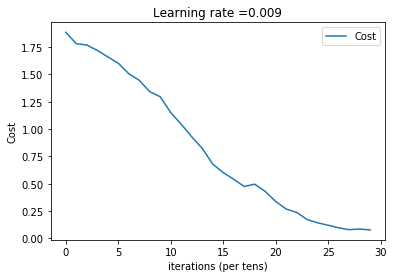

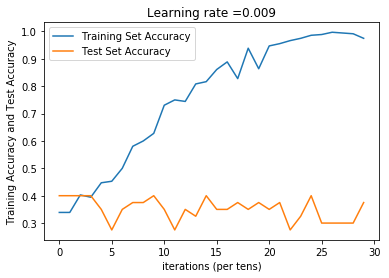

Train Accuracy: 0.975
Test Accuracy: 0.375


In [89]:
_, _, parameters1 = model_with_L2(X_train, Y_train, X_test, Y_test,0,64,30)

## No Regularization, mini batch size of 360(Whole Batch), 100 epochs

Cost after epoch 0: 1.752253
Train Accuracy: 0.336111
Test Accuracy: 0.325
Cost after epoch 5: 1.488769
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 10: 1.444929
Train Accuracy: 0.386111
Test Accuracy: 0.4
Cost after epoch 15: 1.351358
Train Accuracy: 0.458333
Test Accuracy: 0.425
Cost after epoch 20: 1.257000
Train Accuracy: 0.486111
Test Accuracy: 0.45
Cost after epoch 25: 1.198050
Train Accuracy: 0.516667
Test Accuracy: 0.35
Cost after epoch 30: 1.117103
Train Accuracy: 0.575
Test Accuracy: 0.275
Cost after epoch 35: 1.031502
Train Accuracy: 0.647222
Test Accuracy: 0.275
Cost after epoch 40: 0.920977
Train Accuracy: 0.7
Test Accuracy: 0.325
Cost after epoch 45: 0.790322
Train Accuracy: 0.736111
Test Accuracy: 0.325
Cost after epoch 50: 0.659716
Train Accuracy: 0.802778
Test Accuracy: 0.3
Cost after epoch 55: 0.542826
Train Accuracy: 0.838889
Test Accuracy: 0.25
Cost after epoch 60: 0.427597
Train Accuracy: 0.877778
Test Accuracy: 0.25
Cost after epoch 65: 0.315075
Tr

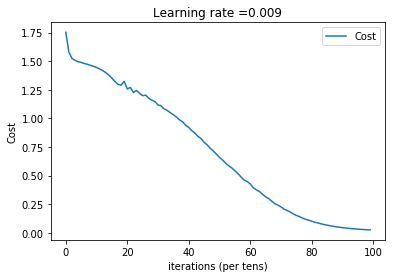

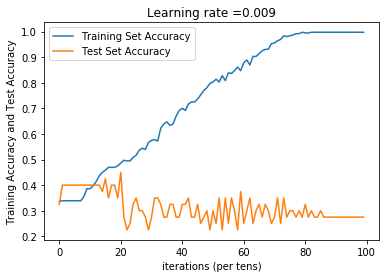

Train Accuracy: 0.997222
Test Accuracy: 0.275


In [88]:
_, _, parameters2 = model_with_L2(X_train, Y_train, X_test, Y_test,0,360,100)

## L2 Regularization(lambda=0.001), mini batch size of 360(Whole Batch), 100 epochs

Cost after epoch 0: 1.760186
Train Accuracy: 0.333333
Test Accuracy: 0.325
Cost after epoch 5: 1.497488
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 10: 1.453275
Train Accuracy: 0.391667
Test Accuracy: 0.4
Cost after epoch 15: 1.365236
Train Accuracy: 0.480556
Test Accuracy: 0.45
Cost after epoch 20: 1.334832
Train Accuracy: 0.477778
Test Accuracy: 0.375
Cost after epoch 25: 1.224828
Train Accuracy: 0.519444
Test Accuracy: 0.3
Cost after epoch 30: 1.162063
Train Accuracy: 0.561111
Test Accuracy: 0.225
Cost after epoch 35: 1.067339
Train Accuracy: 0.611111
Test Accuracy: 0.3
Cost after epoch 40: 0.976166
Train Accuracy: 0.669444
Test Accuracy: 0.275
Cost after epoch 45: 0.855283
Train Accuracy: 0.708333
Test Accuracy: 0.325
Cost after epoch 50: 0.730523
Train Accuracy: 0.775
Test Accuracy: 0.225
Cost after epoch 55: 0.606387
Train Accuracy: 0.813889
Test Accuracy: 0.3
Cost after epoch 60: 0.478079
Train Accuracy: 0.852778
Test Accuracy: 0.325
Cost after epoch 65: 0.41520

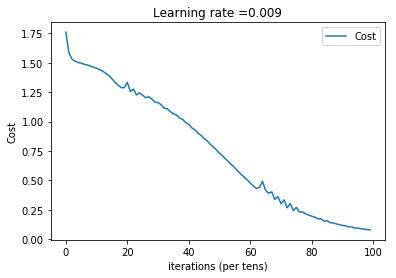

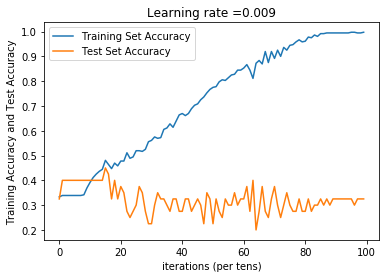

Train Accuracy: 0.997222
Test Accuracy: 0.325


In [90]:
_, _, parameters3 = model_with_L2(X_train, Y_train, X_test, Y_test,0.001,360,100)

## L2 Regularization(lambda=0.05), mini batch size of 64, 30 epochs

Cost after epoch 0: 2.281696
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 5: 1.763447
Train Accuracy: 0.425
Test Accuracy: 0.3
Cost after epoch 10: 1.514930
Train Accuracy: 0.563889
Test Accuracy: 0.35
Cost after epoch 15: 1.249719
Train Accuracy: 0.663889
Test Accuracy: 0.25
Cost after epoch 20: 1.160004
Train Accuracy: 0.722222
Test Accuracy: 0.325
Cost after epoch 25: 0.816263
Train Accuracy: 0.836111
Test Accuracy: 0.35


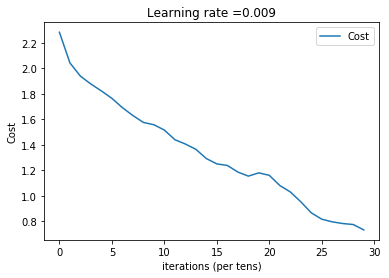

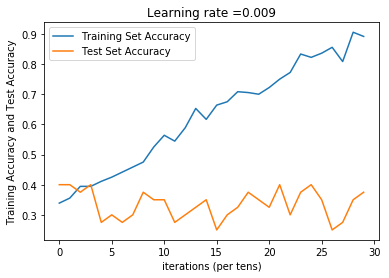

Train Accuracy: 0.891667
Test Accuracy: 0.375


In [91]:
_, _, parameters4 = model_with_L2(X_train, Y_train, X_test, Y_test,0.05,64,30)

## L2 Regularization(lambda=0.001), mini batch size of 64, 30 epochs

Cost after epoch 0: 1.896042
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 5: 1.666825
Train Accuracy: 0.461111
Test Accuracy: 0.325
Cost after epoch 10: 1.279651
Train Accuracy: 0.630556
Test Accuracy: 0.275
Cost after epoch 15: 0.715787
Train Accuracy: 0.822222
Test Accuracy: 0.3
Cost after epoch 20: 0.409668
Train Accuracy: 0.930556
Test Accuracy: 0.375
Cost after epoch 25: 0.172309
Train Accuracy: 0.991667
Test Accuracy: 0.3


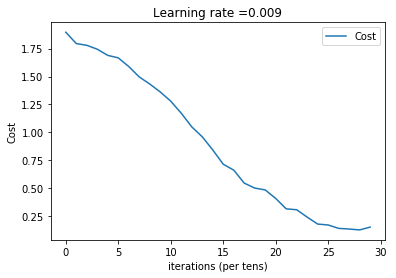

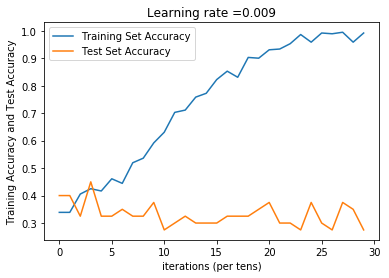

Train Accuracy: 0.991667
Test Accuracy: 0.275


In [92]:
_, _, parameters5 = model_with_L2(X_train, Y_train, X_test, Y_test,0.001,64,30)

## L2 Regularization(lambda=0.01), mini batch size of 360, 100 epochs

Cost after epoch 0: 1.831582
Train Accuracy: 0.341667
Test Accuracy: 0.325
Cost after epoch 5: 1.554387
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 10: 1.503373
Train Accuracy: 0.386111
Test Accuracy: 0.4
Cost after epoch 15: 1.411905
Train Accuracy: 0.461111
Test Accuracy: 0.425
Cost after epoch 20: 1.319779
Train Accuracy: 0.466667
Test Accuracy: 0.35
Cost after epoch 25: 1.259932
Train Accuracy: 0.505556
Test Accuracy: 0.325
Cost after epoch 30: 1.190078
Train Accuracy: 0.561111
Test Accuracy: 0.325
Cost after epoch 35: 1.095822
Train Accuracy: 0.608333
Test Accuracy: 0.275
Cost after epoch 40: 1.005302
Train Accuracy: 0.658333
Test Accuracy: 0.275
Cost after epoch 45: 0.906334
Train Accuracy: 0.683333
Test Accuracy: 0.3
Cost after epoch 50: 0.805660
Train Accuracy: 0.736111
Test Accuracy: 0.3
Cost after epoch 55: 0.735436
Train Accuracy: 0.713889
Test Accuracy: 0.375
Cost after epoch 60: 0.645034
Train Accuracy: 0.786111
Test Accuracy: 0.275
Cost after epoch 65: 0.

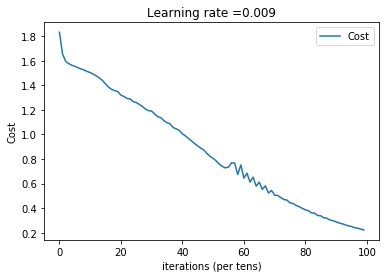

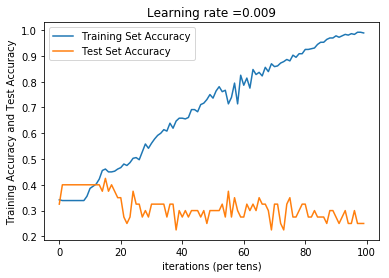

Train Accuracy: 0.988889
Test Accuracy: 0.25


In [93]:
_, _, parameters6 = model_with_L2(X_train, Y_train, X_test, Y_test,0.01,360,100)

## No Regularization, mini batch size of 8, 100 epochs

Cost after epoch 0: 1.557587
Train Accuracy: 0.330556
Test Accuracy: 0.25
Cost after epoch 5: 1.176561
Train Accuracy: 0.627778
Test Accuracy: 0.375
Cost after epoch 10: 0.581346
Train Accuracy: 0.883333
Test Accuracy: 0.375
Cost after epoch 15: 0.230162
Train Accuracy: 0.972222
Test Accuracy: 0.275
Cost after epoch 20: 0.244817
Train Accuracy: 0.952778
Test Accuracy: 0.325
Cost after epoch 25: 0.114391
Train Accuracy: 0.983333
Test Accuracy: 0.175
Cost after epoch 30: 0.094425
Train Accuracy: 0.983333
Test Accuracy: 0.275
Cost after epoch 35: 0.061335
Train Accuracy: 0.997222
Test Accuracy: 0.2
Cost after epoch 40: 0.082798
Train Accuracy: 0.997222
Test Accuracy: 0.225
Cost after epoch 45: 0.058515
Train Accuracy: 0.997222
Test Accuracy: 0.3
Cost after epoch 50: 0.242995
Train Accuracy: 0.961111
Test Accuracy: 0.35
Cost after epoch 55: 0.048733
Train Accuracy: 0.997222
Test Accuracy: 0.35
Cost after epoch 60: 0.050577
Train Accuracy: 0.997222
Test Accuracy: 0.3
Cost after epoch 65: 0.

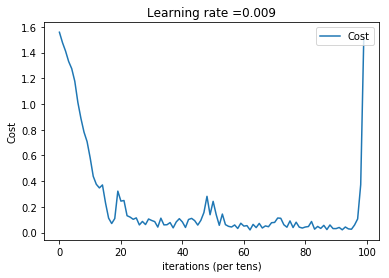

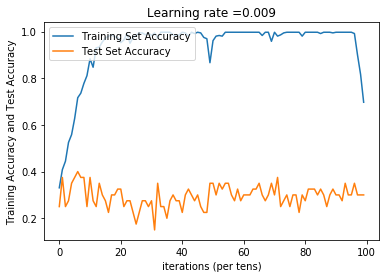

Train Accuracy: 0.697222
Test Accuracy: 0.3


In [96]:
_, _, parameters7 = model_with_L2(X_train, Y_train, X_test, Y_test,0,8,100)

## L2 Regularization(lambda=0.001), mini batch size of 8, 30 epochs

Cost after epoch 0: 1.566341
Train Accuracy: 0.336111
Test Accuracy: 0.25
Cost after epoch 5: 1.137267
Train Accuracy: 0.616667
Test Accuracy: 0.3
Cost after epoch 10: 0.565661
Train Accuracy: 0.911111
Test Accuracy: 0.4
Cost after epoch 15: 0.310540
Train Accuracy: 0.963889
Test Accuracy: 0.3
Cost after epoch 20: 0.215277
Train Accuracy: 0.969444
Test Accuracy: 0.25
Cost after epoch 25: 0.170919
Train Accuracy: 0.986111
Test Accuracy: 0.375


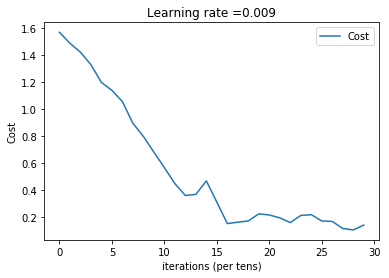

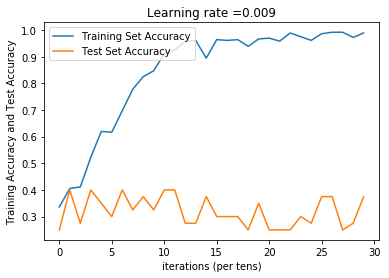

Train Accuracy: 0.988889
Test Accuracy: 0.375


In [97]:
_, _, parameters8 = model_with_L2(X_train, Y_train, X_test, Y_test,0.001,8,30)

## L2 Regularization(lambda=0.005), mini batch size of 360(Whole Batch), 100 epochs

Cost after epoch 0: 1.791917
Train Accuracy: 0.333333
Test Accuracy: 0.325
Cost after epoch 5: 1.526105
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 10: 1.478569
Train Accuracy: 0.383333
Test Accuracy: 0.4
Cost after epoch 15: 1.392914
Train Accuracy: 0.447222
Test Accuracy: 0.35
Cost after epoch 20: 1.295738
Train Accuracy: 0.475
Test Accuracy: 0.3
Cost after epoch 25: 1.227408
Train Accuracy: 0.511111
Test Accuracy: 0.325
Cost after epoch 30: 1.132272
Train Accuracy: 0.611111
Test Accuracy: 0.3
Cost after epoch 35: 1.034636
Train Accuracy: 0.652778
Test Accuracy: 0.3
Cost after epoch 40: 0.914477
Train Accuracy: 0.691667
Test Accuracy: 0.275
Cost after epoch 45: 0.805239
Train Accuracy: 0.697222
Test Accuracy: 0.2
Cost after epoch 50: 0.724941
Train Accuracy: 0.761111
Test Accuracy: 0.275
Cost after epoch 55: 0.653195
Train Accuracy: 0.822222
Test Accuracy: 0.275
Cost after epoch 60: 0.551734
Train Accuracy: 0.841667
Test Accuracy: 0.275
Cost after epoch 65: 0.460904


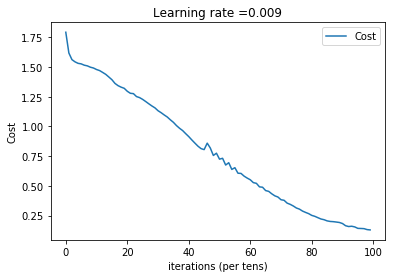

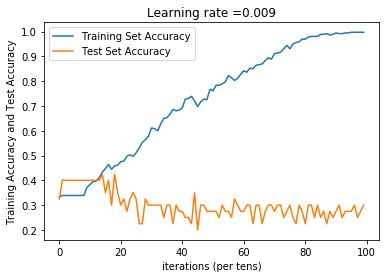

Train Accuracy: 0.997222
Test Accuracy: 0.3


In [28]:
_, _, parameters9 = model_with_L2(X_train, Y_train, X_test, Y_test,0.005,360,100)

## Get The Parameters Of the Best Model(L2 Regularization(lambda=0.001,whole batch at epoch 15)

Cost after epoch 0: 1.760186
Train Accuracy: 0.333333
Test Accuracy: 0.325
Cost after epoch 5: 1.497488
Train Accuracy: 0.338889
Test Accuracy: 0.4
Cost after epoch 10: 1.453275
Train Accuracy: 0.391667
Test Accuracy: 0.4


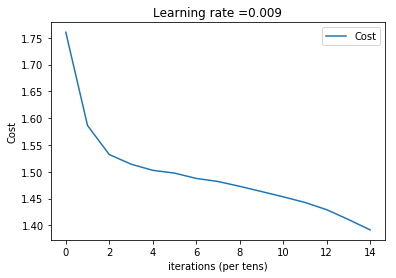

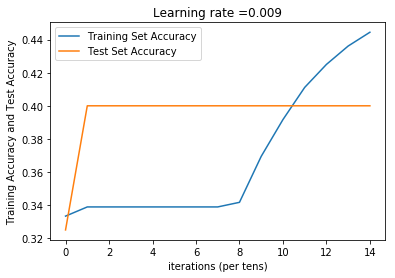

Train Accuracy: 0.444444
Test Accuracy: 0.4


In [34]:
_, _, finalPara = model_with_L2(X_train, Y_train, X_test, Y_test,0.001,360,15)

In [64]:
def getParameters(X, parameters):
    W1 = tf.convert_to_tensor(parameters["W1"])
    W2 = tf.convert_to_tensor(parameters["W2"])
    params = {"W1": W1,
              "W2": W2}
    
    x = tf.placeholder("float", [None, 227,227,3])
    getFlattern = getFCValues(x, params)
    sess = tf.Session()
    flatternValues = sess.run(getFlattern, feed_dict = {x: X})
    return flatternValues

In [65]:
def getFCValues(X, parameters):
    W1 = parameters['W1']
    W2 = parameters['W2']
    Z1 = tf.nn.conv2d(X, W1, strides=[1, 1, 1, 1], padding='SAME')
    A1 = tf.nn.relu(Z1)
    P1 = tf.nn.max_pool(A1, ksize = [1, 8, 8, 1], strides = [1, 8, 8, 1], padding='SAME')
    Z2 = tf.nn.conv2d(P1, W2, strides=[1, 1, 1, 1], padding='SAME')
    A2 = tf.nn.relu(Z2)
    P2 = tf.nn.max_pool(A2, ksize = [1, 4, 4, 1], strides = [1, 4, 4, 1], padding='SAME')
    P = tf.contrib.layers.flatten(P2)
    return P

In [69]:
fcValues_train = getParameters(X_train, finalPara)

y = 4


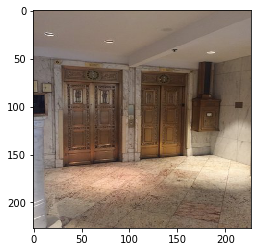

In [123]:
import scipy
from PIL import Image
from scipy import ndimage
index = 55
plt.imshow(X_train[index])
print ("y = " + str(np.argmax(Y_train[index])+1))

#my_image = X_train[index].reshape(1, 227,227,3)
my_image=X_train
my_image_prediction = predict(my_image, finalPara)

In [124]:
fcValues_train.shape

(360, 1024)

In [121]:
fcValues_train

array([[ 0.0511057 ,  0.        ,  0.04559053, ...,  0.0609019 ,
         0.04102693,  0.06265287],
       [ 0.09237789,  0.        ,  0.08132861, ...,  0.05562047,
         0.02733755,  0.07242431],
       [ 0.11149862,  0.        ,  0.10148286, ...,  0.02863419,
         0.04634389,  0.08246613],
       ..., 
       [ 0.08413757,  0.        ,  0.09158312, ...,  0.04476147,
         0.01425394,  0.06667694],
       [ 0.09067093,  0.        ,  0.02249104, ...,  0.09071372,
         0.07103412,  0.11842044],
       [ 0.07435727,  0.        ,  0.06603889, ...,  0.08387993,
         0.03846631,  0.11817537]], dtype=float32)

In [125]:
np.savetxt('fcValues_train.txt',fcValues_train,fmt="%f")

In [126]:
fcValues_test = getParameters(X_test, finalPara)

In [128]:
np.savetxt('fcValues_test.txt',fcValues_test,fmt="%f")

In [132]:
np.savetxt('train_labels.txt',train_labels)

In [133]:
np.savetxt('test_labels.txt',test_labels)